# End-to-End Multi-class Dog Breed Classification

##Problem
Identifying the breed of a dog given an image of a dog.
##Data
The data is from kaggle: https://www.kaggle.com/competitions/dog-breed-identification/code
##Evaluation
Multi Class Log loss - The evaluation is a file with prediction probabilities for each dog breed of each test image.
##Features
Information about data:
* Unstructured data
* There are 120 breeds of dogs (This means there are 120 different classes.)
* There are aroung 10000+ items in training and test sets.
* Training sets have label whereas test sets do not.

In [ ]:
#Unzip uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"

#Get Our Workscpace Ready

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.17.0


In [ ]:
#Import TensorFlow Hub
import tensorflow_hub as hub
print("TF hub version:",hub.__version__)

TF hub version: 0.16.1


In [ ]:
#Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "Not available")

GPU available


## Getting our Data ready (Turning into Tensors)

With all machine learning models, our data has to be in numerical format. So, we'll be turning our images into Tensors (numerical representations)

In [ ]:
#Checking our labels
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


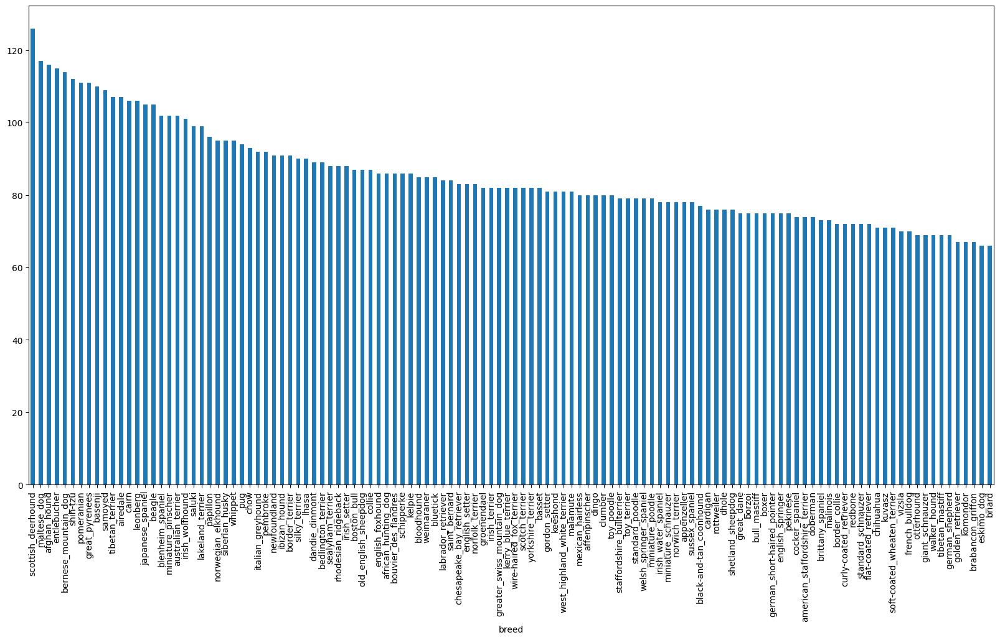

In [ ]:
# Number of images of each breed
labels_csv["breed"].value_counts().plot(kind="bar",figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

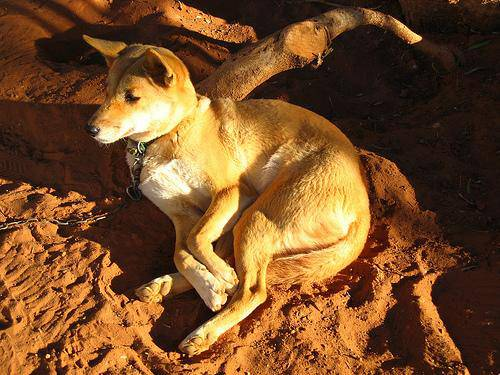

In [ ]:
#Viewing an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and their labels
Getting list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Creating pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#Checking whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Matches actual amount. You can proceed.")
else:
  print("Does not match.")

Matches actual amount. You can proceed.


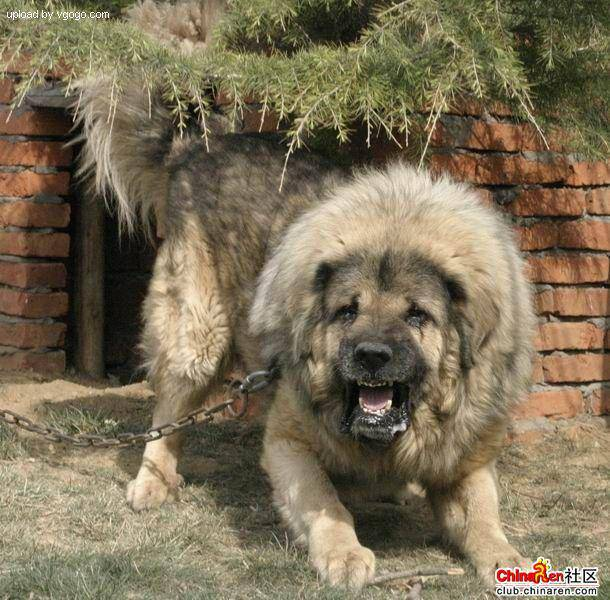

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Preparing our labels

In [ ]:
labels = labels_csv["breed"]
labels

,breed
0,boston_bull
1,dingo
2,pekinese
3,bluetick
4,golden_retriever
...,...
10217,borzoi
10218,dandie_dinmont
10219,airedale
10220,miniature_pinscher


In [ ]:
import numpy as np
# labels = np.array(labels)
# labels

In [ ]:
#Alternative method
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels)==len(filenames):
  print("Number matches.")
else:
  print("Number does not match.")

Number matches.


In [ ]:
#Finding the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turning a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turning every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with 1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000}

In [ ]:
#Splitting data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing Images (Turning Images into Tensors[numerical representation])

creating a function to do following things:
1. Take an image filepath as input.
2. Use TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Normalize the image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224).
6. Return the modifier `image`

https://www.tensorflow.org/guide/data

https://www.tensorflow.org/tutorials/load_data/images

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
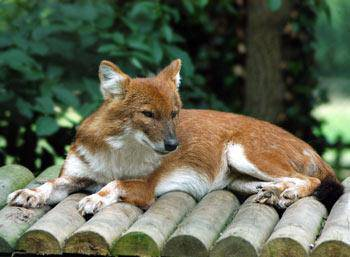

In [ ]:
# Looking what importing an image looks like
# Convert image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# turning image into tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# Define image size
IMG_SIZE = 224

#Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """Takes an image file path and turns the image into a tensor"""
  #Read in an image file
  image = tf.io.read_file(image_path)
  #Turn the jpg image into numerical tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  #Convert the colour channel values from 0 - 255 to 0 - 1 values.
  image = tf.image.convert_image_dtype(image, tf.float32) #Normalization
  #Resize the image to our desired value
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Turning data into batches

Why turn data into batches?
As we process large number of images, they all might not fit into the memory. Although we're using GPU for faster computation, it also has limited memory.

So that's why it is an ideal step to do 32 (batch size) images at a time (We can manually adjust the batch size when needed.)

In order to use TensorFlow effectively, we need to convert our data into Tensor tuples form which looks like this:
`(image, label)`

In [ ]:
#Create a function to return a tuple.
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosiated label, processes the image and return a tuble of (image, label)"""
  image = process_image(image_path)
  return image,label

In [ ]:
#Demo of above funtion
(process_image(X[40],y[40]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.99609005, 0.96119833, 0.95770377],
        [0.98501533, 0.94666374, 0.93379605],
        [0.99749774, 0.9770274 , 0.9565523 ],
        ...,
        [0.34569168, 0.5497533 , 0.22850783],
        [0.4276134 , 0.6322353 , 0.33483163],
        [0.36833197, 0.5772412 , 0.29097825]],

       [[0.9687435 , 0.965289  , 0.9172323 ],
        [0.94134724, 0.93233955, 0.8760108 ],
        [0.92182285, 0.9180851 , 0.8512452 ],
        ...,
        [0.36644298, 0.57037514, 0.24943131],
        [0.36225268, 0.5662274 , 0.2703323 ],
        [0.34930357, 0.5534058 , 0.27435333]],

       [[0.82989013, 0.87487435, 0.75133675],
        [0.7506709 , 0.7958162 , 0.66784185],
        [0.75523835, 0.8078179 , 0.67545015],
        ...,
        [0.40426058, 0.60512996, 0.2932135 ],
        [0.35947898, 0.55773896, 0.2682605 ],
        [0.38644102, 0.5856088 , 0.3115852 ]],

       ...,

       [[0.45484307, 0.5300532 , 0.29153773],
        [0.44

Making a function to turn all of our data (X & y) into batches.

In [ ]:
#Define the batch size
BATCH_SIZE = 31

#Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but does not shuffle if it's validataion data.
  Also, accepts test data as input (no labels).
  """
  #If the data is a test dataset, we don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) #only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filename
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    #Turn filepath and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    #Shuffling pathnames and labels before mapping as image processor function is faster than shuffling images.
    data = data.shuffle(buffer_size=len(X))
    #Create tensor tuples then preprocess image and finally convert into batches
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch


In [ ]:
# Creating training and validataion data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
#Checking different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt
#create a function for viewing images in a data batch
def show_25_images(images, labels):
  """Displays a plot of 25 images and their labels from a data batch"""
  #Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    #Create subplots (5 rows, 5 columns, index)
    ax = plt.subplot(5, 5, i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.04937874, 0.092516  , 0.11441679],
          [0.04817998, 0.08014777, 0.09310295],
          [0.07302406, 0.08027719, 0.08627451],
          ...,
          [0.30980393, 0.20000002, 0.14509805],
          [0.29292712, 0.18883058, 0.14509805],
          [0.28627452, 0.19215688, 0.14509805]],
 
         [[0.0603561 , 0.09567718, 0.11520413],
          [0.05557809, 0.08636205, 0.09989254],
          [0.06796391, 0.08239319, 0.08608717],
          ...,
          [0.3098477 , 0.20004378, 0.14514181],
          [0.29684868, 0.19275215, 0.14901961],
          [0.2901961 , 0.19607845, 0.14901961]],
 
         [[0.06543243, 0.09879961, 0.10909607],
          [0.07080708, 0.09411766, 0.10588236],
          [0.07368987, 0.09154999, 0.10321552],
          ...,
          [0.3137255 , 0.20392159, 0.14901961],
          [0.29953602, 0.19543947, 0.15170693],
          [0.29288343, 0.19876577, 0.15170693]],
 
         ...,
 
         [[0.7583151 , 0.6485111 , 0.60537386],
          [0.78641

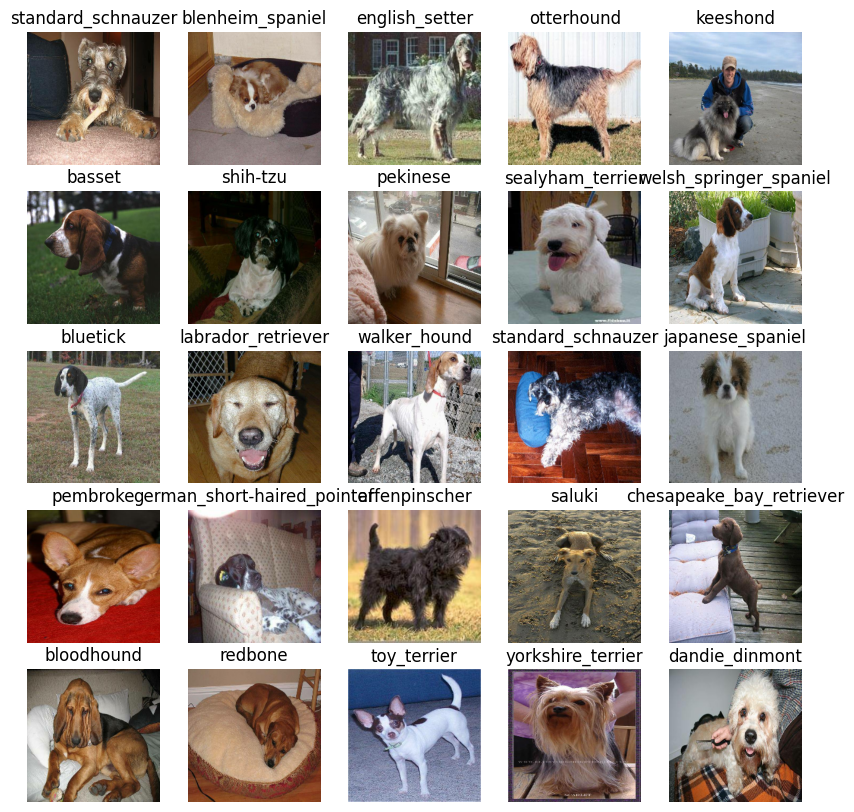

In [ ]:
# Visualizing the data
show_25_images(train_images, train_labels)

## Building a model

Things we need to define before building models
1. The input shape (our images shape, in the form of tensors) to our model.
2. The output shape (image labels, in the form of tensors) of our model.
3. The URL of the model we want to use.

In [ ]:
# !pip install tf_keras

In [ ]:
import tf_keras as tfk

In [ ]:
#Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #Batch, height, width, colour channels.

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#Setup model uRL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Since inputs, outputs, and model are ready, putting them into Keras dl model now.

Creating a function which:
- Takes the input shape, output hsap enad the model we've chosen as parameters.
- Defines the layers in a Keras model in sequential fashion.
- Compiles the model (says how it should be evaluated and improved).
- Builds the model (tells the model the input shape it'll be getting).
- Return the model.

In [ ]:
#Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with: ", model_url)

    # Setup the model layers
    model = tfk.Sequential([
        hub.KerasLayer(model_url),  # Layer 1 (input layer)
        tfk.layers.Dense(units=output_shape, activation="softmax")  # Layer 2 (output layer)
    ])

    # Compile the model
    model.compile(
        loss=tfk.losses.CategoricalCrossentropy(),
        optimizer=tfk.optimizers.Adam(),
        metrics=["accuracy"]
    )
    #Build the model
    model.build(input_shape)
    return model


In [ ]:
model = create_model()
model.summary()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
Callbacks are helper function a model can use during training to do such things as save its progress, check its progress or stop training early if model stops improving.

Creating two callbacks,
one for tensorboard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

Things to do to setup a tensorboard callback:
1. load the tensorboard notebook extension
2. create a tensorboard callback which is able to save logs to a direcotry and pass it to our model's `fit()` function.
3. Visualize our models training logs wiht the `%tensorboard` magic function (We do this after model training).

In [ ]:
# Load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a tensorboard call back
def create_tensorboard_callback():
  #Create a log directory for storing tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment.
                        datetime.datetime.now().strftime("%Y%m%d=%H%M$S"))
  return tfk.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a ceratin evaluation metrics stop improving.

In [ ]:
# Create early stopping callbacks
early_stopping = tfk.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training a model (on subset of data)

Our fist model is only going to train on 1000 images, to make sure everything is working.


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
#Check GPU availability status
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "GPU NOT AVAILABLE")

GPU Available


# Create a function to train a model
- Create a model using `create_model()`
- Setup a TensorBoard callback using `create_tensorboard_callback()`
- Call the `fit()` function on our model passing it the training data, validation data, number of epochs for train for (NUM_EPOCHS) and the callbacks we'd like to use.
- Return the model.

In [ ]:
# Building a function to train and return a trained model
def train_model():
  """Trains a given model and returns the trained version."""

  # Create a model
  model = create_model()

  #Create new TensorBoard session everytime we trained a model.
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks = [tensorboard, early_stopping])

  #Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
26/26 [==============================] - 196s 7s/step - loss: 4.5952 - accuracy: 0.1075 - val_loss: 3.4570 - val_accuracy: 0.2400
Epoch 2/100
26/26 [==============================] - 5s 175ms/step - loss: 1.6046 - accuracy: 0.7025 - val_loss: 2.1654 - val_accuracy: 0.4950
Epoch 3/100
26/26 [==============================] - 5s 199ms/step - loss: 0.5595 - accuracy: 0.9325 - val_loss: 1.6567 - val_accuracy: 0.5950
Epoch 4/100
26/26 [==============================] - 4s 160ms/step - loss: 0.2482 - accuracy: 0.9825 - val_loss: 1.4739 - val_accuracy: 0.6550
Epoch 5/100
26/26 [==============================] - 4s 160ms/step - loss: 0.1423 - accuracy: 0.9975 - val_loss: 1.4031 - val_accuracy: 0.6650
Epoch 6/100
26/26 [==============================] - 6s 218ms/step - loss: 0.0979 - accuracy: 1.0000 - val_loss: 1.3384 - val_accuracy: 0.6600
Epoch 7/100
26/26 [===================

### Checking the TensorBoard Logs
The tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 169ms/step


array([[3.28241062e-04, 4.17748270e-05, 1.86576380e-03, ...,
        1.61491669e-04, 1.70762942e-05, 1.14298542e-03],
       [4.08801856e-03, 3.46194982e-04, 7.57384161e-03, ...,
        2.07696296e-03, 3.72380530e-03, 1.53017245e-04],
       [3.67520954e-07, 2.15440787e-06, 5.51334597e-05, ...,
        9.85704362e-04, 8.31325269e-06, 3.70951602e-04],
       ...,
       [1.07001979e-05, 2.23613242e-04, 1.04677565e-04, ...,
        2.01667699e-05, 1.36464753e-03, 1.11285000e-04],
       [3.78542533e-03, 2.77166400e-04, 5.56896302e-05, ...,
        8.33349695e-05, 3.05137728e-05, 7.25817448e-03],
       [3.33685020e-04, 2.84242578e-05, 2.09074700e-03, ...,
        2.28106370e-03, 4.34149406e-04, 4.77926333e-05]], dtype=float32)

In [ ]:
np.sum(predictions[0])

0.9999999

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.4115124e-05 1.8313344e-04 1.2108296e-04 3.7895916e-05 1.1783998e-03
 4.8814276e-05 4.2044958e-05 7.7219907e-04 9.0491306e-03 3.2251965e-02
 5.0315080e-05 2.3902361e-05 5.9496332e-04 6.4746011e-04 2.8840855e-03
 1.4420849e-03 1.8475379e-04 5.1474804e-04 4.3282352e-04 7.3879288e-04
 6.4727978e-06 7.3383289e-04 1.5894338e-04 5.0604485e-05 1.9182773e-02
 9.0732268e-05 7.1094830e-05 2.9545964e-04 4.2626663e-04 1.2333727e-04
 1.6313969e-04 5.2587980e-05 7.3073883e-05 2.1456714e-05 1.0599465e-04
 3.4101588e-05 2.2187112e-04 4.8091024e-04 1.2593239e-04 4.6717358e-01
 2.1103068e-04 2.6761796e-05 8.9626564e-03 1.9853376e-05 2.3111606e-04
 2.1600967e-05 5.2723968e-05 9.6758892e-04 9.2853457e-05 6.7865179e-04
 2.4353800e-04 2.9909244e-04 3.1653620e-04 1.7222336e-03 6.8469594e-06
 4.0704041e-04 7.8467951e-05 3.0090127e-05 6.5909990e-05 2.3787115e-05
 6.8254092e-05 4.9338536e-04 6.9382644e-05 5.4908392e-05 1.6724560e-04
 5.3284905e-04 4.9903534e-05 5.5205205e-04 1.7765049e-04 3.9016093e-05
 2.510

In [ ]:
unique_breeds[113]

'walker_hound'

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """Turns an array of prediction probabilities into a label."""
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

Since validation data is still in batch dataset, it needs to be unbatched to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels."""
  images = []
  labels = []
  # Loop through unbatch data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

Visualizing:
- Prediction labels
- Validation labels (truth labels)
- Validation images

Creating a function which:
- Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
- Convert the prediction probabilities to a predicted label.
- Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """View the prediction, ground truth and image for sample n"""
  pred_prob, true_label, image=prediction_probabilities[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                 np.max(pred_prob)*100,
                                 true_label),
            color=color)
  pass

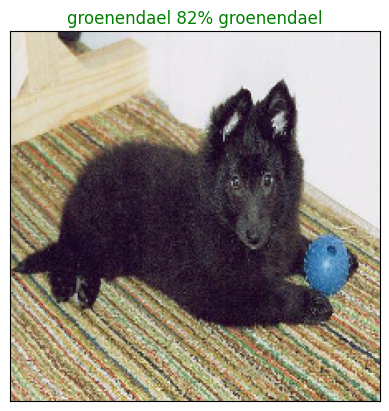

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Create a function to visualize top 10 predictions of model.

Function will:
- Take an input of prediction probabilities array and a ground truth array and an integer.
- Find the prediction using `get_pred_label()`.
- Find the top 10:
  - Prediction probabilities indexes
  - Prediction probabilities values
  - Prediction labels
- Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """Plus the top 10 highest prediction confidence along with the truth label for sample n."""
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
           labels=top_10_pred_labels,
           rotation="vertical")

  #Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


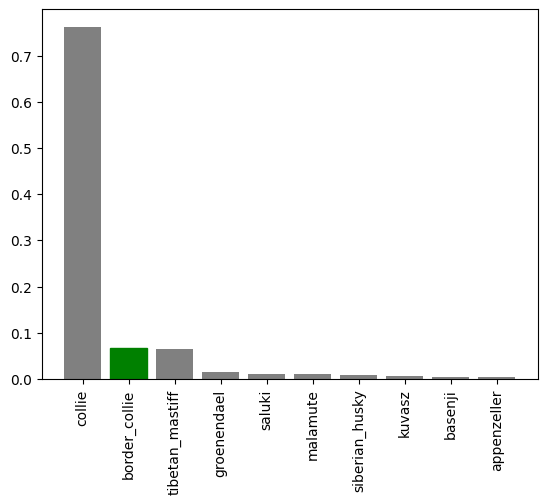

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

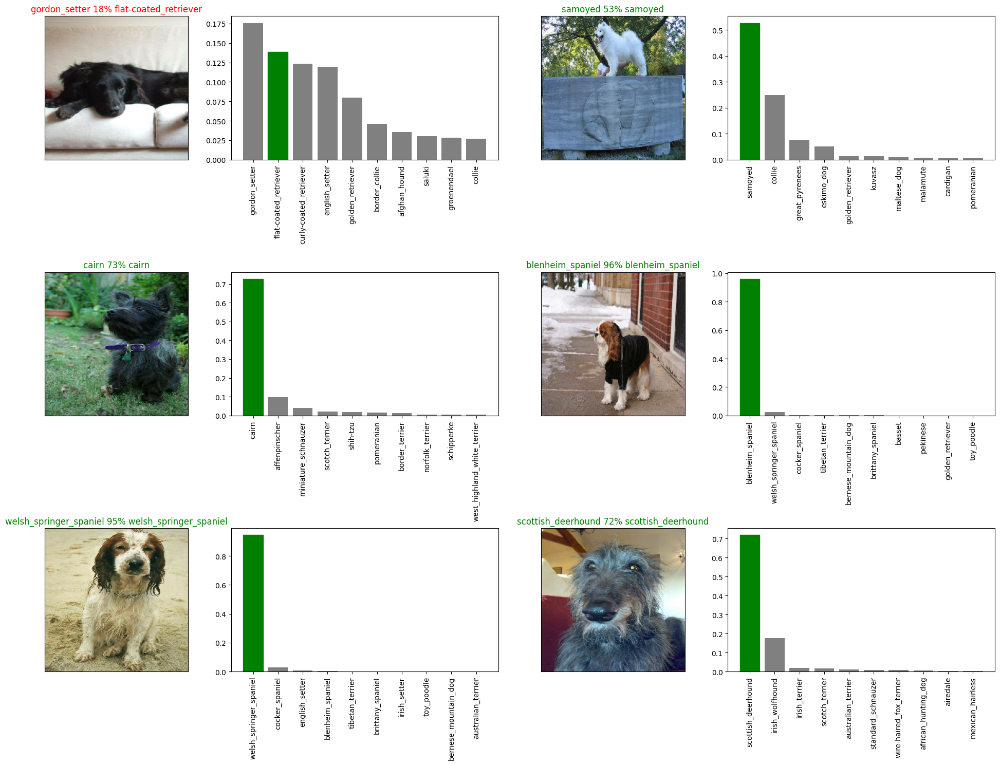

In [ ]:
# Checking few predictions and their different values
i_multiplier = 20
nrows = 3
ncols = 2
nimages = nrows*ncols
plt.figure(figsize=(10*ncols, 5*nrows))
for i in range(nimages):
  plt.subplot(nrows, 2*ncols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(nrows, 2*ncols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)

plt.show()

## Saving and reloading a trained model


In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """Saves a given model in a models directory and appends a suffix (string)"""

  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" #Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """Loads a saved model from a specified path."""
  print(f"Loading saved model from {model_path}...")
  model = tfk.models.load_model(model_path,
                                custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20240809-082854-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog Vision/models/20240809-082854-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
Loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog Vision/models/20240806-122938-1000-images-mobilenetv2-Adam.h5")

Loading saved model from /content/drive/MyDrive/Dog Vision/models/20240806-122938-1000-images-mobilenetv2-Adam.h5...


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 106ms/step - loss: 1.2385 - accuracy: 0.6850


[1.2384614944458008, 0.6850000023841858]

In [ ]:
# Evaluate the loaded model
Loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 104ms/step - loss: 1.2912 - accuracy: 0.6350


[1.2912230491638184, 0.6349999904632568]

## Training a model on the full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validataion accuracy
full_model_early_stopping = tfk.callbacks.EarlyStopping(monitor="accuracy",
                                                        patience=3)

In [ ]:
# Fit the full model to the full data
# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard, full_model_early_stopping])

In [ ]:
save_model(full_model, suffix="full_image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20240809-082902-full_image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20240809-082902-full_image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load the full model
loaded_full_model = load_model("/content/drive/MyDrive/Dog Vision/models/20240806-153425-full_image-set-mobilenetv2-Adam.h5")

Loading saved model from /content/drive/MyDrive/Dog Vision/models/20240806-153425-full_image-set-mobilenetv2-Adam.h5...


## Making predictions on the test dataset
Since our data has been trained on images in the form of tensor batches, to make predictions on the test data, we'll have to get it into the same format.

To make predictions on the test data, we'll:
- Get the test image filenames
- Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `true` (since the test data dosen't have labels)
- Make a predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e7ce78e874945f182a4f5149aa505b09.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ddfbebe13aa8fba30f347c58466215df.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e3cfadb2543190f43da6bb5500c75578.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e646ac89e0832502f9a726c72773cfcc.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e61cd2626c01dd00117eca55fb099f5d.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e6a0eeb3e82e14eb812d9ef22383ec11.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e504cbd0094fc72312087587795be597.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ddbdd621e79563a56443a0dd1ee4c48d.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e6326f6c8ad1e06c0f70546ddfc64067.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e141811c20cade75f5cb3b7da86320a8.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
# test_predictions = loaded_full_model.predict(test_data,verbose=1)

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
# np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

NameError: name 'test_predictions' is not defined

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

## Making predictions on custom images
To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using function. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom images data batch to out model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
import os
custom_path = "/content/drive/MyDrive/Dog Vision/dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/dogs/dog1.jpg',
 '/content/drive/MyDrive/Dog Vision/dogs/dog2.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 3s 3s/step


In [ ]:
custom_preds.shape


(2, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i] for i in range(len(custom_preds)))]
custom_pred_labels

['affenpinscher']

In [ ]:
custom_images = []
#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

IndexError: list index out of range

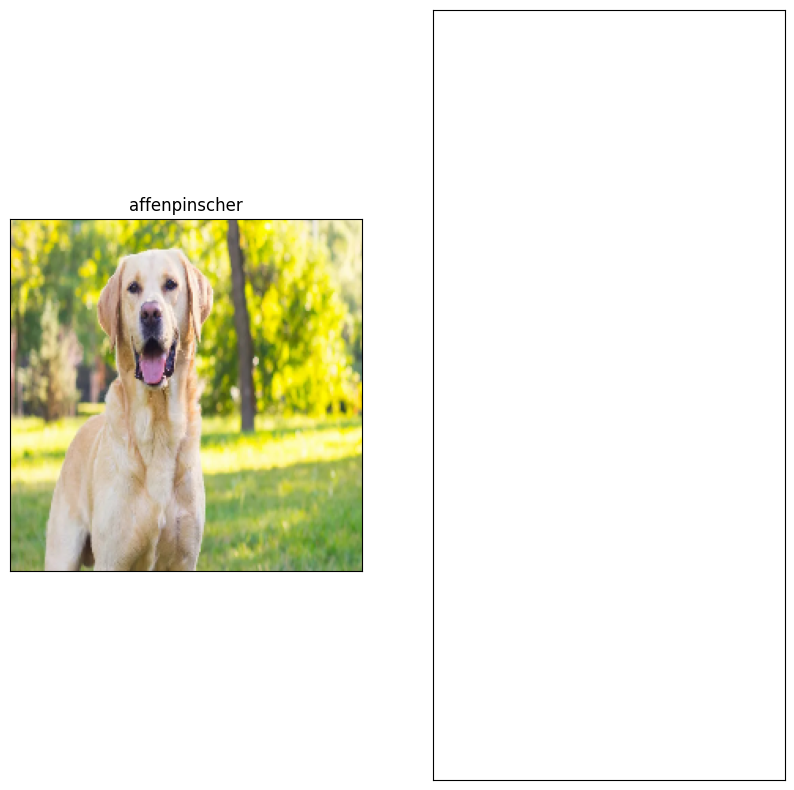

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,2,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)